In [21]:

import os
import pickle
import random
import sys
from datetime import datetime

import cv2
import dlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.regularizers import l2
from mtcnn import MTCNN
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

# Image Preprocessing and Data Preperation
Face Detection
Image Cropping, Alignment and Grayscaling
Rescaling and Padding

This code only needs to be run once to create the dataset used for training.

In [4]:
# Initialize MTCNN detector
detector = MTCNN()

base_dir = "Datasets/combined_dataset_faces_only_mtcnn"
new_dataset_dir = "Datasets/combined_dataset_faces_only_cropped_aligned_gray_resized_padded"
processed_folder = "Datasets/combined_dataset_processed"

# Emotion classes
emotions = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


# Create directories for the new dataset
if not os.path.exists(processed_folder):
    os.makedirs(processed_folder)
for emotion in emotions:
    os.makedirs(os.path.join(processed_folder, emotion), exist_ok=True)

target_width, target_height = 128, 128

for emotion in emotions:
    emotion_dir = os.path.join(base_dir, emotion)
    all_images = os.listdir(emotion_dir)
    existing_dir = os.path.join(processed_folder, emotion)
    existing_images = os.listdir(existing_dir)
    all_images = [img for img in all_images if img not in existing_images]

    for image_name in all_images:
        try:
            img_path = os.path.join(emotion_dir, image_name)
            # Load an image
            img = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Detect faces in the image
            results = detector.detect_faces(image_rgb)
            
            if results:
                # Extract the bounding box and facial landmarks
                x, y, width, height = results[0]['box']
                landmarks = results[0]['keypoints']
                
                # Calculate the angle to align eyes horizontally
                left_eye = landmarks['left_eye']
                right_eye = landmarks['right_eye']
                delta_x = right_eye[0] - left_eye[0]
                delta_y = right_eye[1] - left_eye[1]
                angle = np.arctan(delta_y / delta_x) * 180 / np.pi
                
                # Center coordinates of the face
                center = (x + width // 2, y + height // 2)
                # Rotation matrix
                rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1)
                # Perform the rotation on the entire image
                aligned_image = cv2.warpAffine(img, rotation_matrix, (img.shape[1], img.shape[0]))
                # Crop the face
                aligned_face = aligned_image[y:y + height, x:x + width]
                # Convert to grayscale
                aligned_face_gray = cv2.cvtColor(aligned_face, cv2.COLOR_BGR2GRAY)
                
                # Convert the aligned grayscale face to PIL Image for resizing and padding
                pil_image = Image.fromarray(aligned_face_gray)
                
                # Calculate the scaling factor to maintain aspect ratio
                aspect_ratio = min(target_width / pil_image.width, target_height / pil_image.height)
                new_width = int(pil_image.width * aspect_ratio)
                new_height = int(pil_image.height * aspect_ratio)
                # Resize the image with the scaling factor
                pil_image = pil_image.resize((new_width, new_height), Image.LANCZOS)
                
                # Create a new image with padding
                new_image = Image.new("L", (target_width, target_height), (0))
                paste_position = ((target_width - new_width) // 2, (target_height - new_height) // 2)
                new_image.paste(pil_image, paste_position)
                
                save_path = os.path.join(processed_folder, emotion, image_name)
                new_image.save(save_path)
                
        except Exception as e:
            print(f"Error processing {img_path}: {e}")


1/1 [==============================] - 0s 20ms/step


# Determine Landmarks
Create files with 8 channels, 1 for grayscale image and 7 for facial features as NPY file.

In [31]:
# Define paths
data_dir = 'Datasets/combined_dataset_processed'
new_data_dir = 'Datasets/combined_dataset_enhanced_npy'
shape_predictor_path = 'PretrainedModels/shape_predictor_68_face_landmarks.dat'

if not os.path.exists(new_data_dir):
    os.makedirs(new_data_dir)

# Initialize Dlib's detector and predictor
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(shape_predictor_path)

def extract_landmarks_and_save(image_path, predictor, new_data_dir):
    # Load the original image and prepare output directory and path
    class_dir, image_name = os.path.split(image_path)
    _, class_name = os.path.split(class_dir)
    new_class_dir = os.path.join(new_data_dir, class_name)
    if not os.path.exists(new_class_dir):
        os.makedirs(new_class_dir)
    # Adjust the file extension for saving as .npy
    new_image_path = os.path.join(new_class_dir, image_name.replace('.jpg', '.npy'))

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Prepare an empty list to hold feature images
    feature_images = [gray_image]  # Start with the grayscale image

    # Assuming the image is a cropped face, create a rectangle covering the whole image
    dlib_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for dlib
    rect = dlib.rectangle(0, 0, gray_image.shape[1]-1, gray_image.shape[0]-1)
    landmarks = predictor(dlib_img, rect)

    # Define indices for facial features
    feature_indices = {
        'jawline': list(range(0, 17)),
        'right_eyebrow': list(range(17, 22)),
        'left_eyebrow': list(range(22, 27)),
        'nose': list(range(27, 36)),
        'right_eye': list(range(36, 42)),
        'left_eye': list(range(42, 48)),
        'mouth': list(range(48, 68))
        # 'eyebrows': range(17, 27),  # Combining left and right eyebrows
        # 'eyes': range(36, 48),  # Combining left and right eyes
    }

    # Create and draw feature images
    for feature, indices in feature_indices.items():
        # Initialize a single-channel image (black)
        feature_img = np.zeros_like(gray_image)
        points = np.array([[landmarks.part(n).x, landmarks.part(n).y] for n in indices], dtype=np.int32).reshape((-1, 1, 2))

        # Use polylines to draw the feature
        cv2.polylines(feature_img, [points], isClosed=(feature != 'jawline'), color=255, thickness=1)
        feature_images.append(feature_img)

    # Stack the single-channel images to form a multi-channel image
    multi_channel_image = np.stack(feature_images, axis=-1)

    # Save the multi-channel image as NPY
    np.save(new_image_path, multi_channel_image)

def process_directory_with_landmarks(directory, new_data_dir, predictor):
    total_files = sum([len(files) for r, d, files in os.walk(directory)])
    processed_files = 0
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            for image_name in os.listdir(class_dir):
                image_path = os.path.join(class_dir, image_name)
                extract_landmarks_and_save(image_path, predictor, new_data_dir)
                processed_files += 1
                progress_percentage = (processed_files / total_files) * 100
                print(f"\rProcessed {processed_files}/{total_files} files ({progress_percentage:.2f}%)", end="")
                sys.stdout.flush()
    print("\nFinished processing all files.")

# Process the directory and save images with additional channels
process_directory_with_landmarks(data_dir, new_data_dir, predictor)


Processed 882/73522 files (1.20%)

KeyboardInterrupt: 

Visualisation of the generated files

Displaying: Datasets/combined_dataset_enhanced_npy/happy/PrivateTest_23955431.npy


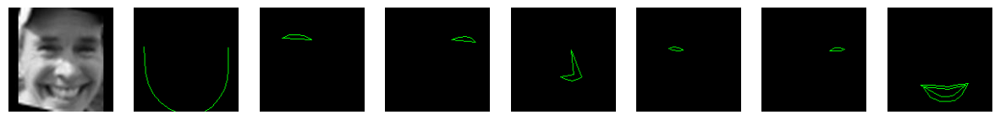

Displaying: Datasets/combined_dataset_enhanced_npy/happy/Training_94050905.npy


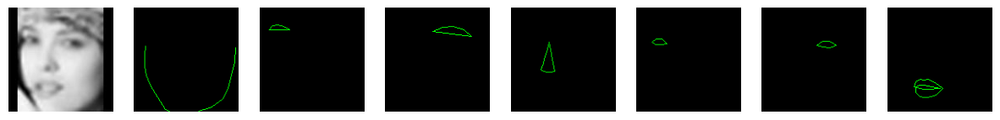

Displaying: Datasets/combined_dataset_enhanced_npy/happy/Training_91789459.npy


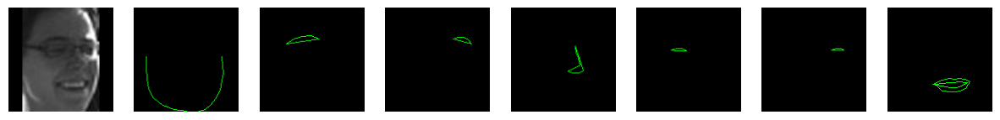

Displaying: Datasets/combined_dataset_enhanced_npy/happy/Training_16821066.npy


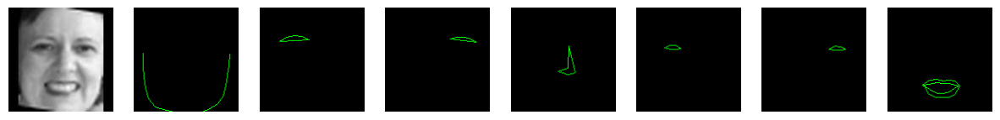

Displaying: Datasets/combined_dataset_enhanced_npy/happy/train_02736_aligned.npy


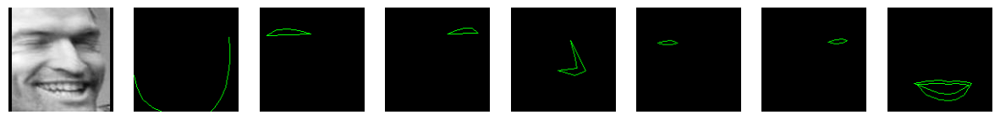

In [113]:
def display_image_and_channels(image_data):
    n_channels = image_data.shape[2]
    fig, axs = plt.subplots(1, n_channels, figsize=(15, 5))
    
    for i in range(n_channels):
        # For grayscale visualization, ensure the single channel is repeated 3 times
        if i == 0:  # Assuming the first channel is the grayscale original image
            axs[i].imshow(image_data[:, :, i], cmap='gray')
        else:
            # Visualize the additional channels, which represent the facial features
            # Here, a mask is used to only display the areas of interest
            mask = image_data[:, :, i] > 0  # Creating a mask where the feature is drawn
            display_img = np.zeros(image_data[:, :, 0].shape + (3,), dtype=np.uint8)  # Prepare a blank RGB image
            display_img[..., 1][mask] = 255  # Draw the feature in green on the mask
            axs[i].imshow(display_img)
        axs[i].axis('off')  # Hide axes for better visualization

    plt.show()

def load_and_display_random_images(directory, num_images=15):
    # List all .npy files in the specified directory
    all_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith('.npy')]
    
    # Select a random subset of files
    selected_files = random.sample(all_files, min(len(all_files), num_images))
    
    # Load and display each selected file
    for file_path in selected_files:
        print(f"Displaying: {file_path}")
        image_data = np.load(file_path)
        display_image_and_channels(image_data)

# Specify the directory containing the .npy files for the "happy" class
npy_directory = 'Datasets/combined_dataset_enhanced_npy/happy/'

# Load and display 15 random images and their channels
load_and_display_random_images(npy_directory, num_images=5)

# Create Dataframe

In [14]:
# Define paths to your training and testing directories
# data_dir = 'Datasets/combined_dataset_processed'
data_dir = 'Datasets/combined_dataset_enhanced_npy'

# Function to add images from a directory to a list
def process_directory(directory, data_list):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)

        # Check if it's a directory
        if os.path.isdir(class_dir):
            # Loop through each image in the folder
            for image_name in os.listdir(class_dir):
                if image_name.endswith('.npy'):  # Ensure the file is a .npy file
                    image_path = os.path.join(class_dir, image_name)
                    image = np.load(image_path)

                    # Check if the image is of size 128x128 with 8 channels
                    if image.shape == (128, 128, 8):
                        # Append to the data list
                        data_list.append({'filepath': image_path, 'label': class_name})

# Initialize an empty list for storing data
data_list = []
# Add training images to the data list
process_directory(data_dir, data_list)
# Create a DataFrame from the list
df = pd.DataFrame(data_list)
# Shuffle the DataFrame
df = df.sample(frac=1).reset_index(drop=True)
# Print the amount of images per category before balancing
print("Images per category before balancing:")
print(df['label'].value_counts())
# # Determine the label with the least amount of images
# min_label_count = df['label'].value_counts().min()
# # Reduce all categories to this size by randomly removing entries
# balanced_df = df.groupby('label').sample(n=min_label_count, random_state=42).reset_index(drop=True)
# # Optionally, shuffle the DataFrame again to ensure mixed labels
# balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)
# # Print 15 random samples of the balanced DataFrame
# print(balanced_df.sample(15))
# # Print the amount of images per category after balancing
# print("\nImages per category after balancing:")
# print(balanced_df['label'].value_counts())

Images per category before balancing:
label
happy       17298
neutral     12928
sad         11161
angry        9415
surprise     9302
fear         8649
disgust      4767
Name: count, dtype: int64


# Preprocessing

In [31]:
# Set the image size and batch size
image_size = (128, 128) # Can be increased to improve accuracy or decreased to improve speed. (48, 48) for FER2013, (224, 224) for RAF-DB
batch_size = 40

# Split the data into training, validation, and test sets
train_df, test_df = train_test_split(df, test_size=0.1, random_state=42)  # 80% training, 20% test
train_df, val_df = train_test_split(train_df, test_size=0.11, random_state=42)  # Of the 80% training, split into 60% training and 20% validation

# Calculate and print split ratios
total_samples = len(df)
train_ratio = len(train_df) / total_samples
val_ratio = len(val_df) / total_samples
test_ratio = len(test_df) / total_samples

print(f"Total samples: {total_samples}")
print(f"Training set: {train_ratio:.2f} ({len(train_df)} samples)")
print(f"Validation set: {val_ratio:.2f} ({len(val_df)} samples)")
print(f"Test set: {test_ratio:.2f} ({len(test_df)} samples)\n")

# Encode the labels to integers
label_encoder = LabelEncoder()
train_df['encoded_label'] = label_encoder.fit_transform(train_df['label'])
val_df['encoded_label'] = label_encoder.transform(val_df['label'])
test_df['encoded_label'] = label_encoder.transform(test_df['label'])

def set_shapes(img, label, img_shape=(128, 128, 8), label_shape=(7, )):
    img.set_shape(img_shape)
    label.set_shape(label_shape)
    return img, label

# Update the preprocess_npy function to not use class_indices
def preprocess_npy(file_path, label):
    # Load .npy file
    image = np.load(file_path.numpy())
    # Normalize image data
    image = image.astype(np.float32) / 255.0
    # One-hot encode the label
    label = tf.one_hot(label, depth=7)  # Assuming 7 classes
    return image, label

# Update the create_dataset function
def create_dataset(df, batch_size):
    file_paths = df['filepath'].values
    labels = df['encoded_label'].values
    dataset = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    dataset = dataset.map(lambda x, y: tf.py_function(preprocess_npy, [x, y], [tf.float32, tf.float32]), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.map(set_shapes)
    dataset = dataset.repeat()
    dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
    return dataset

# Create datasets without needing to pass class_indices
train_dataset = create_dataset(train_df, batch_size)
val_dataset = create_dataset(val_df, batch_size)
test_dataset = create_dataset(test_df, batch_size)

# Calculate class weights for the training data
labels_for_class_weight = train_df['encoded_label'].values
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(labels_for_class_weight),
                                     y=labels_for_class_weight)

# Convert class weights to a dictionary to pass to model.fit
class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}
print(class_weight_dict)

min_dataset_size = batch_size

assert len(train_df) >= min_dataset_size, "Training dataset is smaller than the batch size."
assert len(val_df) >= min_dataset_size, "Validation dataset is smaller than the batch size."
assert len(test_df) >= min_dataset_size, "Test dataset is smaller than the batch size."
print(len(train_df), len(val_df), len(test_df))


# for images, labels in train_dataset.take(1):  # Take a single batch from the dataset
#     print("Image batch shape:", images.shape)
#     print("Label batch shape:", labels.shape)

Total samples: 73520
Training set: 0.80 (58889 samples)
Validation set: 0.10 (7279 samples)
Test set: 0.10 (7352 samples)

{0: 1.121695238095238, 1: 2.1994024276377218, 2: 1.2247363933198843, 3: 0.6064528752677542, 4: 0.8047363961846457, 5: 0.9429179876389022, 6: 1.1296782980682538}
58889 7279 7352


# Model Definition

In [32]:
input_shape = (128, 128, 8)
l2_reg = 0.001  # Regularization strength
dropout = [0.15, 0.4]
n_filters = [128, 64, 32, 128]

model = Sequential([
    Input(shape=input_shape),
    # First Conv Block
    Conv2D(n_filters[0], (3, 3), padding='same', activation='relu', kernel_regularizer=l2(l2_reg)), 
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(dropout[0]),
    # Second Conv Block
    Conv2D(n_filters[1], (3, 3), padding='same', activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(dropout[0]),
    # Third Conv Block
    Conv2D(n_filters[2], (3, 3), padding='same', activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(dropout[0]),
    # Flatten and Dense Layers
    Flatten(),
    Dense(n_filters[3], activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    Dropout(dropout[1]),
    Dense(7, activation='softmax', kernel_regularizer=l2(l2_reg))  # Assuming 7 classes for the output
])

model.compile(optimizer=Adam(learning_rate=0.00015), loss='categorical_crossentropy', metrics=['accuracy'])
# model.summary()

# Callbacks

In [33]:
# Early stopping to prevent overfitting. This stops training when the model's performance on the validation set starts to degrade.
early_stopper = EarlyStopping(
    monitor='val_loss',  # Metric to be monitored
    patience=3,         # Number of epochs with no improvement after which training will be stopped. Reduced from 10
    restore_best_weights=True  # Restores model weights from the epoch with the best value of the monitored metric
)

# Create a ModelCheckpoint callback
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
checkpoint = ModelCheckpoint(
    f'logs/model_checkpoint_{timestamp}.keras',  # Path where to save the model
    monitor='val_loss',     # Metric to monitor
    save_best_only=False,    # Save only the best model. Set False to save the model at the end of every epoch so restarting from specific epoch is possible
    save_weights_only=False, # Save only the weights
    mode='min',             # Minimize the monitored metric (val_loss) min before
    verbose=1               # Verbose output
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=2,
    min_lr=0.0001,
    cooldown=3,
    verbose=1
)

# Model Training

In [ ]:
# Load the last saved weights
# model.load_weights('logs/model_checkpoint_20240225_085054.keras')

epochs = 10 # When resuming training, set epochs to the total number of epochs you want to train, not just the additional epochs. The model.fit() method continues training for the specified number of epochs, starting from the current epoch count. Typically, 10 to 100 epochs are used. Start with e.g. 30-50.

history = model.fit(
    train_dataset,  # Training data
    epochs=epochs,  # Number of epochs
    validation_data=val_dataset,  # Validation data
    class_weight=class_weight_dict,  # Class weights
    steps_per_epoch=len(train_df) // batch_size,  # Number of steps per epoch, optional if using tf.data.Dataset
    validation_steps=len(val_df) // batch_size,  # Number of validation steps, optional if using tf.data.Dataset
    verbose=1  # Show training log
    # callbacks=[early_stopper, checkpoint]
)

# Save the training history for later analysis
# with open(f'logs/training_history_{timestamp}.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

Epoch 1/10
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 2829s 2s/step - accuracy: 0.2934 - loss: 2.5232 - val_accuracy: 0.4109 - val_loss: 1.9398
Epoch 2/10
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 2844s 2s/step - accuracy: 0.3976 - loss: 2.0286 - val_accuracy: 0.4144 - val_loss: 1.8716
Epoch 3/10
1472/1472 ━━━━━━━━━━━━━━━━━━━━ 2832s 2s/step - accuracy: 0.4491 - loss: 1.8383 - val_accuracy: 0.4675 - val_loss: 1.7160
Epoch 4/10
1004/1472 ━━━━━━━━━━━━━━━━━━━━ 14:44 2s/step - accuracy: 0.4800 - loss: 1.7154

# Evaluation and Visualization

76/76 [==============================] - 24s 304ms/step - loss: 1.1121 - accuracy: 0.6758
Test accuracy:  0.6757877469062805
76/76 [==============================] - 23s 300ms/step
Classification Report
              precision    recall  f1-score   support

       angry       0.58      0.62      0.60       479
     disgust       0.27      0.87      0.41        60
        fear       0.57      0.31      0.40       577
       happy       0.89      0.82      0.86      1584
     neutral       0.58      0.81      0.67       908
         sad       0.60      0.45      0.51       705
    surprise       0.68      0.74      0.71       511

    accuracy                           0.68      4824
   macro avg       0.60      0.66      0.60      4824
weighted avg       0.69      0.68      0.67      4824

Weighted Precision: 0.6920334151766832
Weighted Recall: 0.675787728026534
Weighted F1-Score: 0.6715567093253572


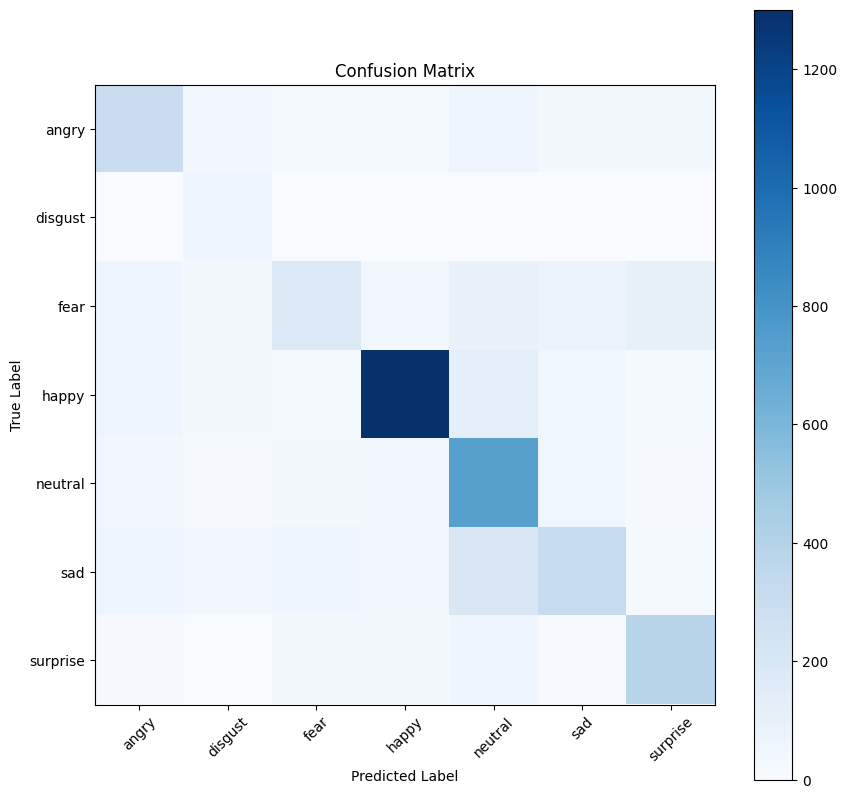

In [10]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset, steps=np.ceil(test_dataset.samples / test_dataset.batch_size))
print("Test accuracy: ", test_accuracy)

# Predictions on the test set
test_dataset.reset() # Ensuring the generator is reset to the beginning
predictions = model.predict(test_dataset, steps=np.ceil(test_dataset.samples / test_dataset.batch_size))
predicted_classes = np.argmax(predictions, axis=1) # Convert predictions to class labels

# Since the generator omits some samples due to rounding down in 'steps', we trim 'true_classes' to match 'predicted_classes' length
true_classes = test_dataset.classes
true_classes = true_classes[:len(predicted_classes)]

class_labels = list(test_dataset.class_indices.keys())

# Classification report
print("Classification Report")
print(classification_report(true_classes, predicted_classes, target_names=class_labels, zero_division=0))

# Additional weighted metric calculations
weighted_precision = precision_score(true_classes, predicted_classes, average='weighted')
weighted_recall = recall_score(true_classes, predicted_classes, average='weighted')
weighted_f1 = f1_score(true_classes, predicted_classes, average='weighted')

print("Weighted Precision:", weighted_precision)
print("Weighted Recall:", weighted_recall)
print("Weighted F1-Score:", weighted_f1)

# Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

Conducting error analysis
This can be done by examining misclassified examples, which can provide insights into what types of errors the model is making

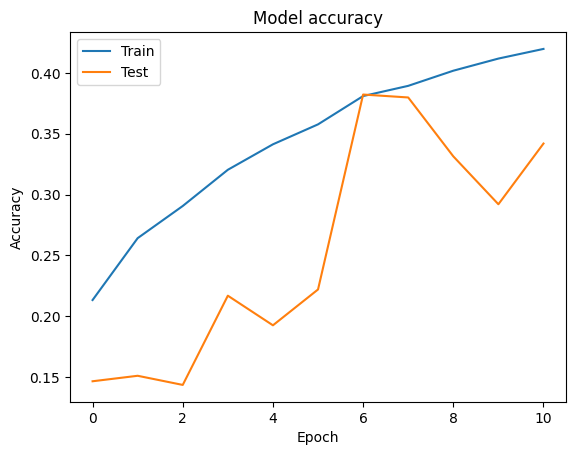

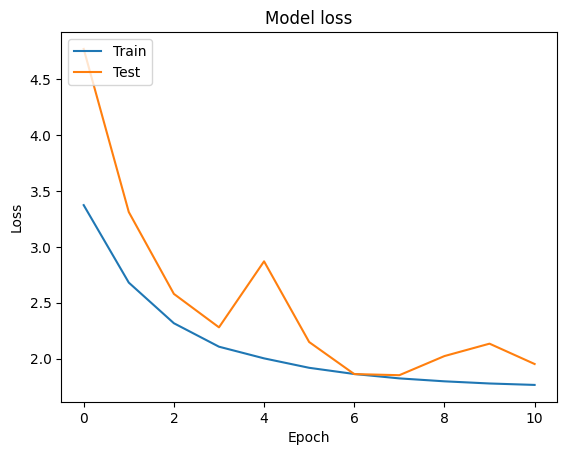

In [16]:
# Learning Curves
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

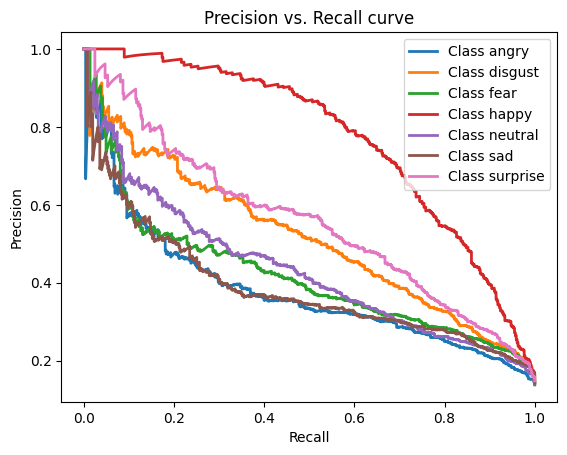

In [30]:
# Precsion-Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class
y_bin = label_binarize(true_classes, classes=np.arange(len(class_labels)))
n_classes = y_bin.shape[1]

# Compute precision-recall curve for each class
precision = dict()
recall = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], predictions[:, i])

# Plot the precision-recall curve
for i in range(n_classes):
    plt.plot(recall[i], precision[i], lw=2, label='Class {}'.format(class_labels[i]))

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="best")
plt.title("Precision vs. Recall curve")
plt.show()

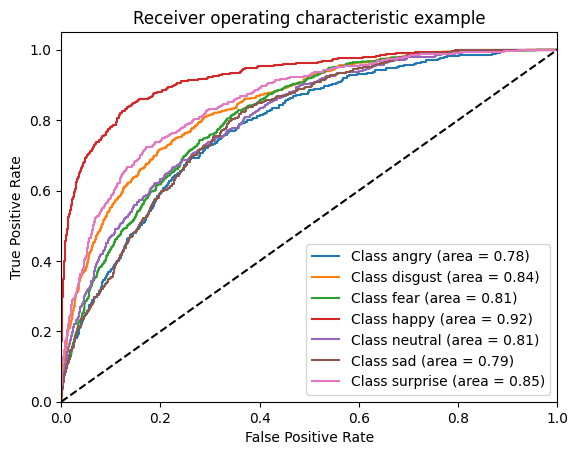

In [31]:
# ROC Curve and AUC
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='Class {} (area = {:.2f})'.format(class_labels[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()